# LGBM & XGBM

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Exploratory Data Analysis[EDA]:

In [ ]:
#loading the dataset
train_data=pd.read_csv(r"C:\Users\karen\Downloads\Titanic_train.csv")
test_data=pd.read_csv(r"C:\Users\karen\Downloads\Titanic_test.csv")

In [3]:
train_data

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [4]:
test_data

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [ ]:
#checking for null values
train_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [8]:
# checking for null values
test_data.isnull().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

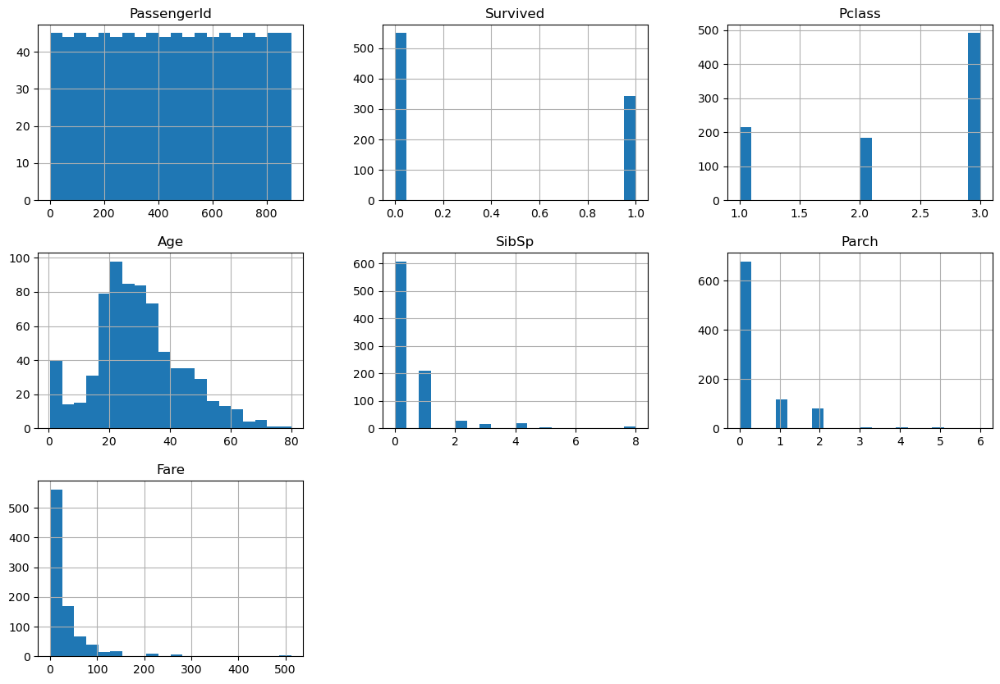

In [13]:
# histogram
train_data.hist(bins=20,figsize=(15,10))
plt.show()

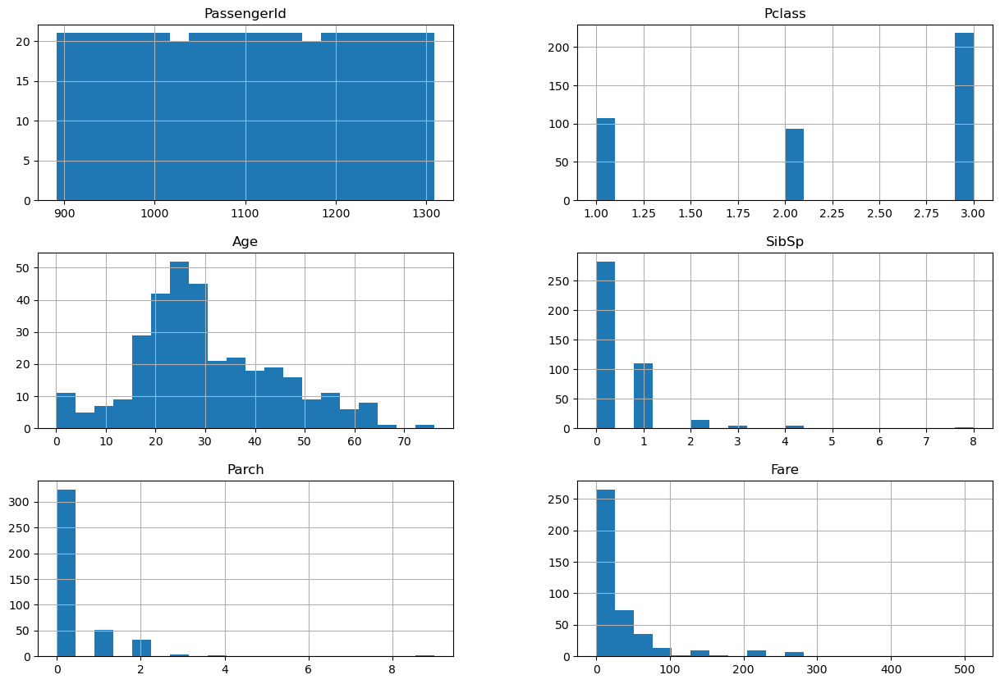

In [18]:
test_data.hist(bins=20,figsize=(15,10))
plt.show()

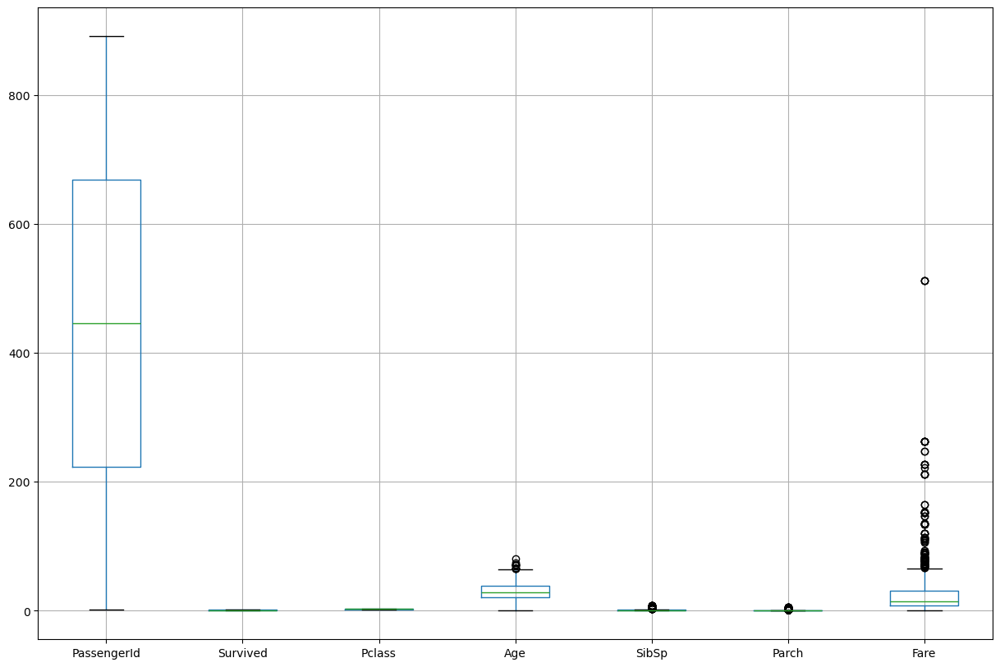

In [16]:
# box plot
plt.figure(figsize=(15,10))
train_data.boxplot()
plt.show()

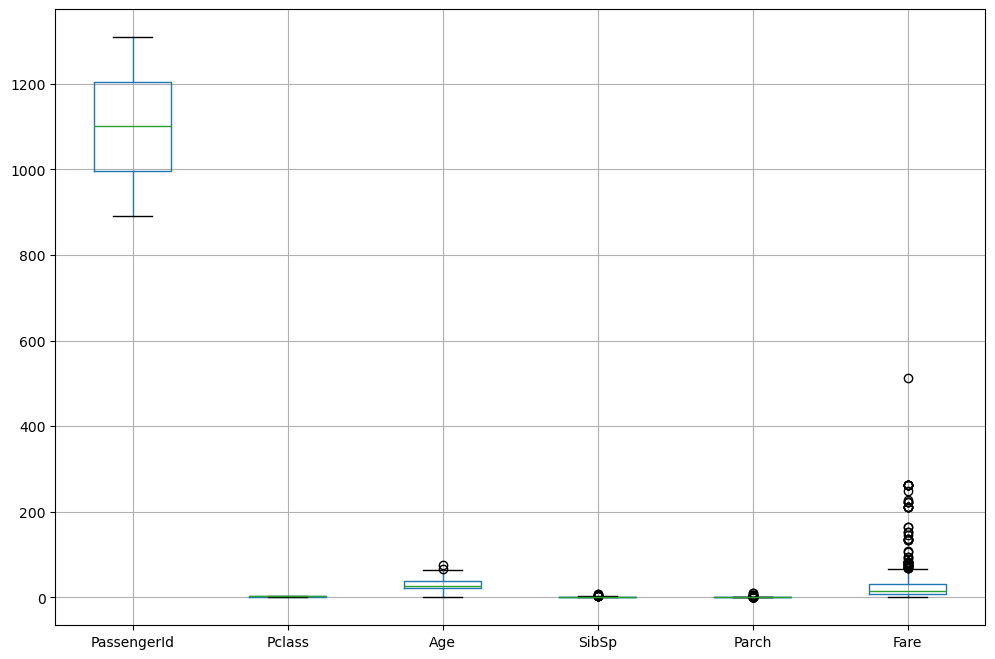

In [19]:
plt.figure(figsize=(12,8))
test_data.boxplot()
plt.show()

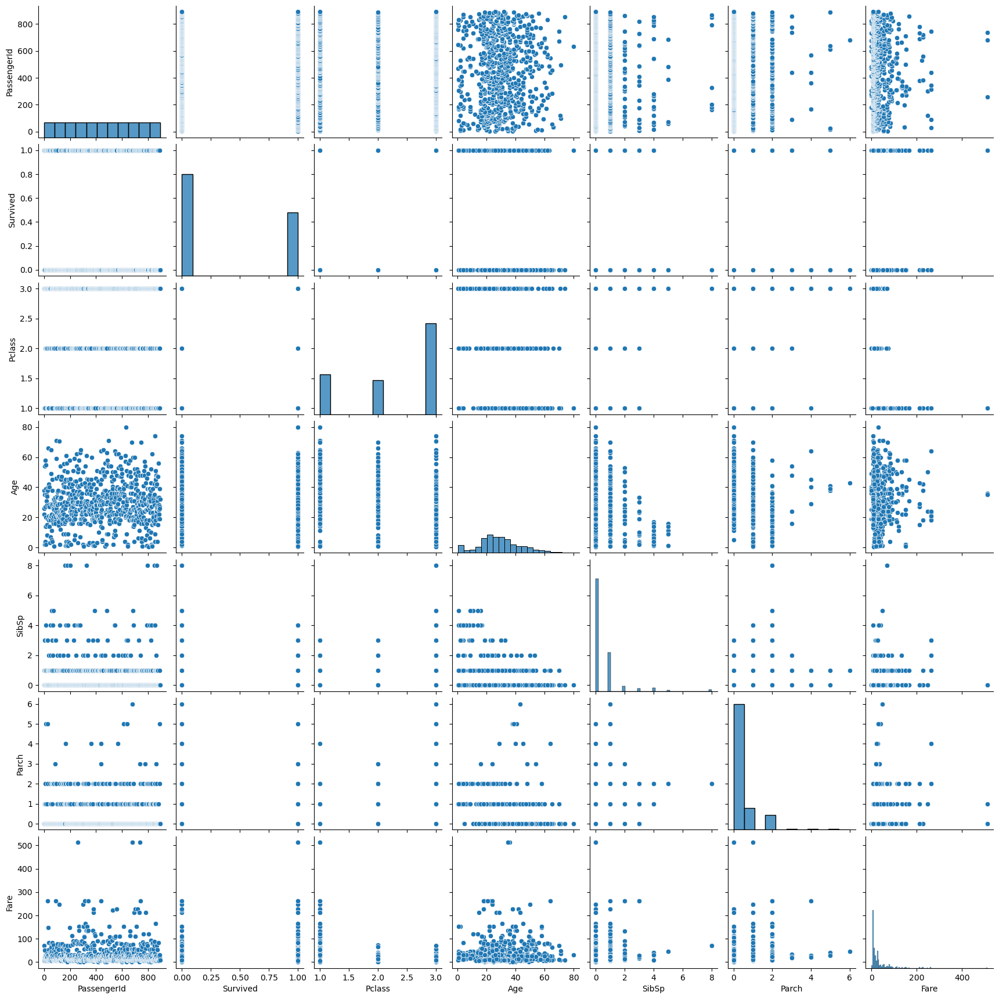

In [20]:
sns.pairplot(train_data)

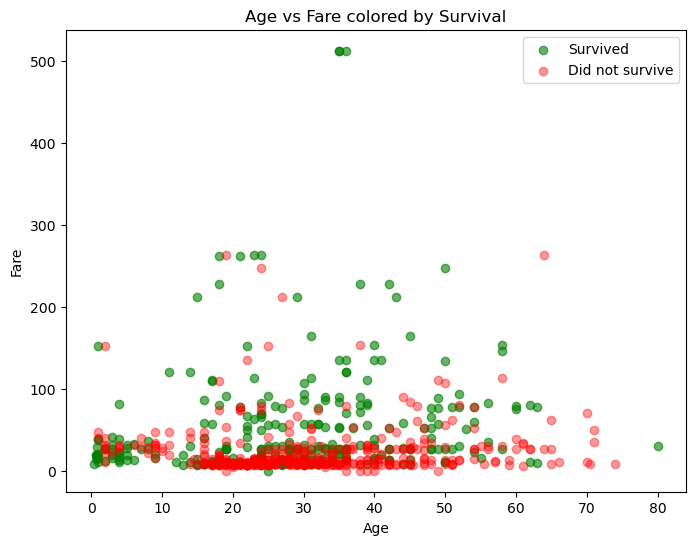

In [22]:
#Scatter plot age vs fare colored by survival
plt.figure(figsize=(8,6))
plt.scatter(train_data[train_data["Survived"]==1]["Age"], train_data[train_data["Survived"]==1]["Fare"], 
            c="green", label="Survived", alpha=0.6)
plt.scatter(train_data[train_data["Survived"]==0]["Age"], train_data[train_data["Survived"]==0]["Fare"], 
            c="red", label="Did not survive", alpha=0.4)
plt.xlabel("Age")
plt.ylabel("Fare")
plt.title("Age vs Fare colored by Survival")
plt.legend()
plt.show()

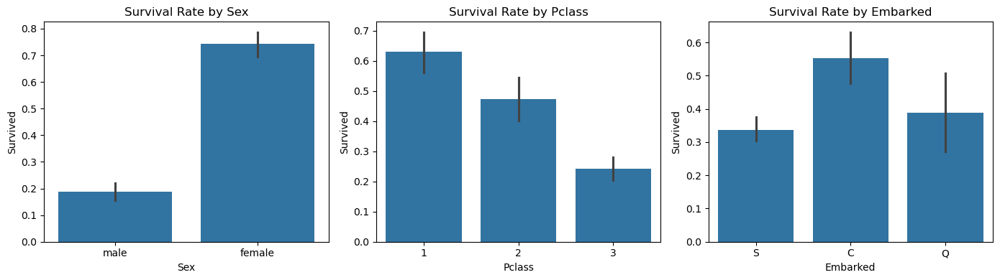

In [24]:
#Bar plots for categorical features
plt.figure(figsize=(14,4))
plt.subplot(1,3,1)
sns.barplot(x="Sex", y="Survived", data=train_data)
plt.title("Survival Rate by Sex")
plt.subplot(1,3,2)
sns.barplot(x="Pclass", y="Survived", data=train_data)
plt.title("Survival Rate by Pclass")
plt.subplot(1,3,3)
sns.barplot(x="Embarked", y="Survived", data=train_data)
plt.title("Survival Rate by Embarked")
plt.tight_layout()
plt.show()

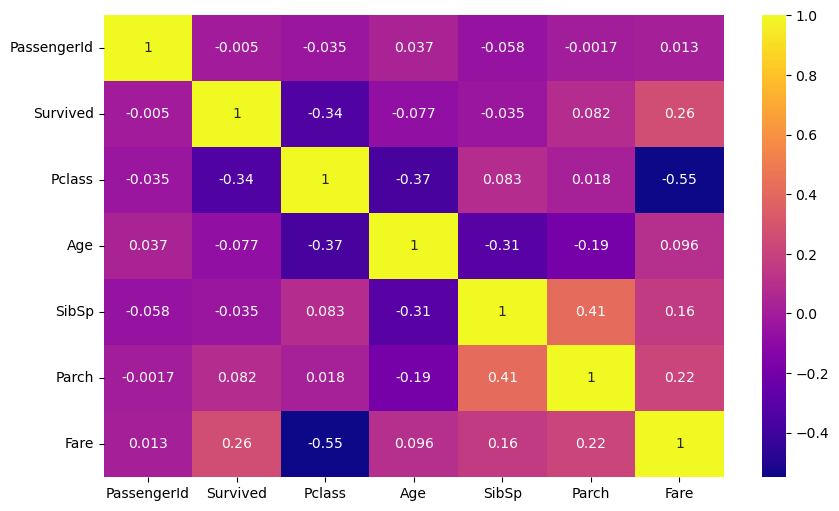

In [35]:
# Select only numeric columns
numeric_data = train_data.select_dtypes(include=["int64", "float64"])
# Compute correlation matrix
corr_matrix = numeric_data.corr()
# Plot heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, cmap="plasma")
plt.show()


## Data Preprocessing:


In [36]:
#imputing the missing values
train_data['Age']=train_data['Age'].fillna(train_data['Age'].mean())
train_data['Embarked']=train_data['Embarked'].fillna(train_data['Embarked'].mode())
test_data['Age']=test_data['Age'].fillna(test_data['Age'].mean())
test_data['Embarked']=test_data['Embarked'].fillna(test_data['Embarked'].mode())

In [37]:
train_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [38]:
train_data.drop(['Name','Ticket'],axis=1,inplace=True)
test_data.drop(['Name','Ticket'],axis=1,inplace=True)

In [39]:
train_data

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,male,22.000000,1,0,7.2500,NaN,S
1,2,1,1,female,38.000000,1,0,71.2833,C85,C
2,3,1,3,female,26.000000,0,0,7.9250,NaN,S
3,4,1,1,female,35.000000,1,0,53.1000,C123,S
4,5,0,3,male,35.000000,0,0,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,male,27.000000,0,0,13.0000,NaN,S
887,888,1,1,female,19.000000,0,0,30.0000,B42,S
888,889,0,3,female,29.699118,1,2,23.4500,NaN,S
889,890,1,1,male,26.000000,0,0,30.0000,C148,C


In [40]:
from sklearn.preprocessing import LabelEncoder

In [41]:
le=LabelEncoder()

In [42]:
train_data['Cabin']=le.fit_transform(train_data['Cabin'])
test_data['Cabin']=le.fit_transform(test_data['Cabin'])

In [43]:
train_data

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,male,22.000000,1,0,7.2500,147,S
1,2,1,1,female,38.000000,1,0,71.2833,81,C
2,3,1,3,female,26.000000,0,0,7.9250,147,S
3,4,1,1,female,35.000000,1,0,53.1000,55,S
4,5,0,3,male,35.000000,0,0,8.0500,147,S
...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,male,27.000000,0,0,13.0000,147,S
887,888,1,1,female,19.000000,0,0,30.0000,30,S
888,889,0,3,female,29.699118,1,2,23.4500,147,S
889,890,1,1,male,26.000000,0,0,30.0000,60,C


In [44]:
dum=pd.get_dummies(train_data[['Sex','Embarked']])
dumm=pd.get_dummies(test_data[['Sex','Embarked']])

In [45]:
train_data.drop(['Sex','Embarked'],axis=1,inplace=True)
test_data.drop(['Sex','Embarked'],axis=1,inplace=True)

In [46]:
train_data

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin
0,1,0,3,22.000000,1,0,7.2500,147
1,2,1,1,38.000000,1,0,71.2833,81
2,3,1,3,26.000000,0,0,7.9250,147
3,4,1,1,35.000000,1,0,53.1000,55
4,5,0,3,35.000000,0,0,8.0500,147
...,...,...,...,...,...,...,...,...
886,887,0,2,27.000000,0,0,13.0000,147
887,888,1,1,19.000000,0,0,30.0000,30
888,889,0,3,29.699118,1,2,23.4500,147
889,890,1,1,26.000000,0,0,30.0000,60


In [47]:
test_data

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Cabin
0,892,3,34.50000,0,0,7.8292,76
1,893,3,47.00000,1,0,7.0000,76
2,894,2,62.00000,0,0,9.6875,76
3,895,3,27.00000,0,0,8.6625,76
4,896,3,22.00000,1,1,12.2875,76
...,...,...,...,...,...,...,...
413,1305,3,30.27259,0,0,8.0500,76
414,1306,1,39.00000,0,0,108.9000,22
415,1307,3,38.50000,0,0,7.2500,76
416,1308,3,30.27259,0,0,8.0500,76


In [48]:
df=train_data.join(dum,how='left')
df1=test_data.join(dumm,how='left')

In [49]:
df

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,22.000000,1,0,7.2500,147,False,True,False,False,True
1,2,1,1,38.000000,1,0,71.2833,81,True,False,True,False,False
2,3,1,3,26.000000,0,0,7.9250,147,True,False,False,False,True
3,4,1,1,35.000000,1,0,53.1000,55,True,False,False,False,True
4,5,0,3,35.000000,0,0,8.0500,147,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,27.000000,0,0,13.0000,147,False,True,False,False,True
887,888,1,1,19.000000,0,0,30.0000,30,True,False,False,False,True
888,889,0,3,29.699118,1,2,23.4500,147,True,False,False,False,True
889,890,1,1,26.000000,0,0,30.0000,60,False,True,True,False,False


In [50]:
df1

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,892,3,34.50000,0,0,7.8292,76,False,True,False,True,False
1,893,3,47.00000,1,0,7.0000,76,True,False,False,False,True
2,894,2,62.00000,0,0,9.6875,76,False,True,False,True,False
3,895,3,27.00000,0,0,8.6625,76,False,True,False,False,True
4,896,3,22.00000,1,1,12.2875,76,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,3,30.27259,0,0,8.0500,76,False,True,False,False,True
414,1306,1,39.00000,0,0,108.9000,22,True,False,True,False,False
415,1307,3,38.50000,0,0,7.2500,76,False,True,False,False,True
416,1308,3,30.27259,0,0,8.0500,76,False,True,False,False,True


In [51]:
from sklearn.model_selection import train_test_split

In [52]:
features=df.drop(['Survived'],axis=1)

In [53]:
target=df['Survived']

In [54]:
features

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Cabin,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,3,22.000000,1,0,7.2500,147,False,True,False,False,True
1,2,1,38.000000,1,0,71.2833,81,True,False,True,False,False
2,3,3,26.000000,0,0,7.9250,147,True,False,False,False,True
3,4,1,35.000000,1,0,53.1000,55,True,False,False,False,True
4,5,3,35.000000,0,0,8.0500,147,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,2,27.000000,0,0,13.0000,147,False,True,False,False,True
887,888,1,19.000000,0,0,30.0000,30,True,False,False,False,True
888,889,3,29.699118,1,2,23.4500,147,True,False,False,False,True
889,890,1,26.000000,0,0,30.0000,60,False,True,True,False,False


In [55]:
target

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

In [56]:
x_train,x_test,y_train,y_test=train_test_split(features,target,test_size=0.3,random_state=42)


## Building Predictive Models:


In [59]:
#!pip install XGBoost

In [60]:
#!pip install lightgbm

## LGBM (Light GB model)

In [61]:
import lightgbm as lgb

In [62]:
model=lgb.LGBMClassifier()

In [64]:
model.fit(x_train,y_train)

[LightGBM] [Info] Number of positive: 231, number of negative: 392
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 444
[LightGBM] [Info] Number of data points in the train set: 623, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.370787 -> initscore=-0.528844
[LightGBM] [Info] Start training from score -0.528844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

LGBMClassifier()

In [65]:
y_pred=model.predict(x_test)

In [ ]:
from sklearn.metrics import classification_report,accuracy_score,precision_score,recall_score,f1_score

In [67]:
accuracy_score(y_test,y_pred)

0.8134328358208955

In [68]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85       157
           1       0.83      0.69      0.75       111

    accuracy                           0.81       268
   macro avg       0.82      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



## XGBoost

In [69]:
from xgboost import XGBClassifier

In [70]:
model2=XGBClassifier()

In [71]:
model2.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [72]:
y_preds=model2.predict(x_test)

In [73]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.81      0.88      0.84       157
           1       0.81      0.71      0.76       111

    accuracy                           0.81       268
   macro avg       0.81      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



In [74]:
from sklearn.model_selection import GridSearchCV

In [75]:
params = {'learning_rate':[0.2,0.3,0.4,0.5], 'max_depth':[2,3,4,5], 'min_child_weight':[2,3,4,5],'n_estimators':[80,60,70,90]}

In [76]:
warnings.simplefilter('ignore')
grid = GridSearchCV(lgb.LGBMClassifier(),params,scoring='accuracy')
grid.fit(x_train,y_train)

[LightGBM] [Info] Number of positive: 184, number of negative: 314
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 377
[LightGBM] [Info] Number of data points in the train set: 498, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.369478 -> initscore=-0.534457
[LightGBM] [Info] Start training from score -0.534457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

GridSearchCV(estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.2, 0.3, 0.4, 0.5],
                         'max_depth': [2, 3, 4, 5],
                         'min_child_weight': [2, 3, 4, 5],
                         'n_estimators': [80, 60, 70, 90]},
             scoring='accuracy')

In [77]:
print(grid.best_params_)

{'learning_rate': 0.2, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 80}


In [79]:
import xgboost as xgb

In [80]:
param={
    'max_depth': [3, 5],
    'learning_rate': [0.1, 0.01],
    'n_estimators': [50, 100]
}
grid_xgb = GridSearchCV(xgb.XGBClassifier(eval_metric='logloss'), param, cv=3, scoring='accuracy')
grid_xgb.fit(x_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraint...
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             param_grid={'learning_rate': [0.1, 0.01], 'max_depth': [3, 5],
                         'n_estimators': [50, 100]},
             scoring='accuracy')

In [81]:
print(grid_xgb.best_params_)

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}


## Comparative Analysis:

In [82]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85       157
           1       0.83      0.69      0.75       111

    accuracy                           0.81       268
   macro avg       0.82      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



In [83]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.81      0.88      0.84       157
           1       0.81      0.71      0.76       111

    accuracy                           0.81       268
   macro avg       0.81      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



In [84]:
lgb_accuracy=accuracy_score(y_test,y_pred)*100
lgb_precision=precision_score(y_test,y_pred)*100
lgb_recall=recall_score(y_test,y_pred)*100
lgb_f1score=f1_score(y_test,y_pred)*100

In [85]:
xgb_accuracy=accuracy_score(y_test,y_preds)*100
xgb_precision=precision_score(y_test,y_preds)*100
xgb_recall=recall_score(y_test,y_preds)*100
xgb_f1score=f1_score(y_test,y_preds)*100

In [86]:
metrics={
    'Metrics':['Accuracy','Precision','Recall','F1'],
    'LGBoost':[lgb_accuracy,lgb_precision,lgb_recall,lgb_f1score],
    'XGBoost':[xgb_accuracy,xgb_precision,xgb_recall,xgb_f1score]
}

In [87]:
metrics_df=pd.DataFrame(metrics)
metrics_df

,Metrics,LGBoost,XGBoost
0,Accuracy,81.343284,80.970149
1,Precision,82.795699,80.612245
2,Recall,69.369369,71.171171
3,F1,75.490196,75.598086


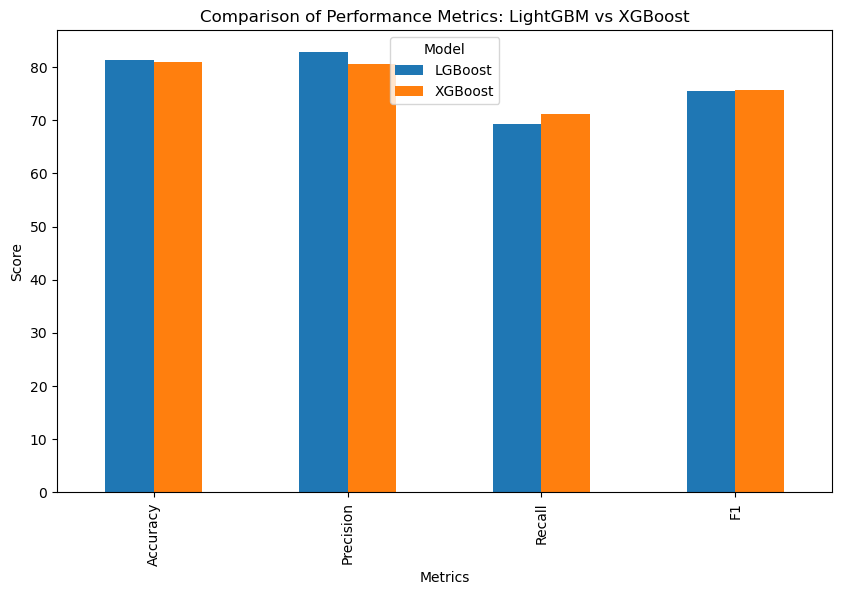

In [88]:
#Visualizations between LightGBM and XGBoost
metrics_df.plot(x='Metrics', kind='bar', figsize=(10, 6))
plt.title("Comparison of Performance Metrics: LightGBM vs XGBoost")
plt.ylabel("Score")
plt.legend(title="Model")
plt.show()